# Tensorizing Flow: Development

12/31/2021, Hongli Zhao, honglizhaobob@uchicago.edu

In [1]:
# import utility functions
import utils
from utils.flow_models import *
from utils.target import *
from utils.training import *

# import pytorch
import torch
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
import torch.distributions as distrib
import torch.distributions.transforms as transform
# set number of threads
torch.set_num_threads(8)

# numerical libs
import scipy
import scipy.io

# import plotting
import matplotlib.pyplot as plt
%matplotlib inline

# import I/O
import os
import sys

def loss_func_init(x, prior_logpdf, targ_logpdf):
        """ evaluate initial KL divergence between posterior distribution (NF + prior) 
        and target. x is samples without flow. This is a Monte-Carlo estimation of the 
        log partition function. """
        return (prior_logpdf - targ_logpdf(x)).mean()

# Ginzburg-Landau 2D

## 1. Rank 3 + ResNet

Running seed 0
::BacthNormFlow: Using exact stats: gl2d, for initialization. 
::BacthNormFlow: Using exact stats: gl2d, for initialization. 
::BacthNormFlow: Using exact stats: gl2d, for initialization. 
::BacthNormFlow: Using exact stats: gl2d, for initialization. 
[ Before Training ]:: ( KL-Divergence ) = 363.7820065571686


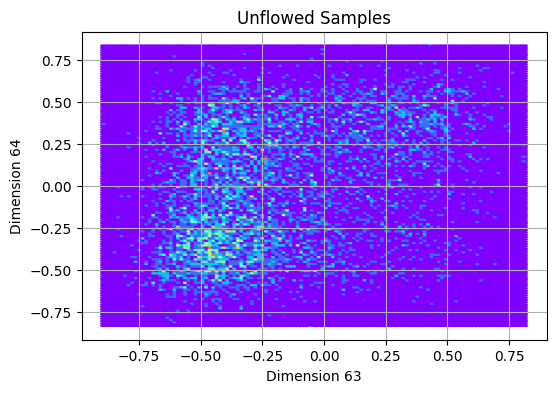

[ #### ]:: In training ...  ... (epoch1=>batch0)
[ #### ]:: In training ...  ... (epoch1=>batch10)
[ #### ]:: In training ...  ... (epoch1=>batch20)
[ #### ]:: In training ...  ... (epoch1=>batch30)
[ #### ]:: In training ...  ... (epoch1=>batch40)
[ #### ]:: In training ...  ... (epoch1=>batch50)
[ #### ]:: In training ...  ... (epoch1=>batch60)
[ #### ]:: In training ...  ... (epoch1=>batch70)
[ #### ]:: In training ...  ... (epoch1=>batch80)
[ #### ]:: In training ...  ... (epoch1=>batch90)


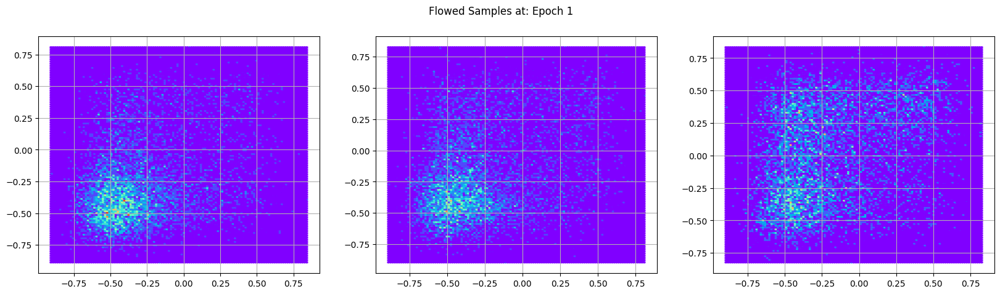

[ Epoch  1 ]:: ( Train Avg. Over Epoch ) = 370.98858343286054, ( Generalization ) = 366.36610864133013
[ ======== ]:: Report Learning Rate =  4.950246693456863e-05
[ ======== ]:: Report Norm of Gradient =  13282.878252328912
[ #### ]:: In training ...  ... (epoch2=>batch0)
[ #### ]:: In training ...  ... (epoch2=>batch10)
[ #### ]:: In training ...  ... (epoch2=>batch20)
[ #### ]:: In training ...  ... (epoch2=>batch30)
[ #### ]:: In training ...  ... (epoch2=>batch40)
[ #### ]:: In training ...  ... (epoch2=>batch50)
[ #### ]:: In training ...  ... (epoch2=>batch60)
[ #### ]:: In training ...  ... (epoch2=>batch70)
[ #### ]:: In training ...  ... (epoch2=>batch80)
[ #### ]:: In training ...  ... (epoch2=>batch90)
[ Epoch  2 ]:: ( Train Avg. Over Epoch ) = 366.178152722403, ( Generalization ) = 360.6449413884894
[ ======== ]:: Report Learning Rate =  4.90098846521612e-05
[ ======== ]:: Report Norm of Gradient =  11377.24778304073
[ #### ]:: In training ...  ... (epoch3=>batch0)
[ #### 

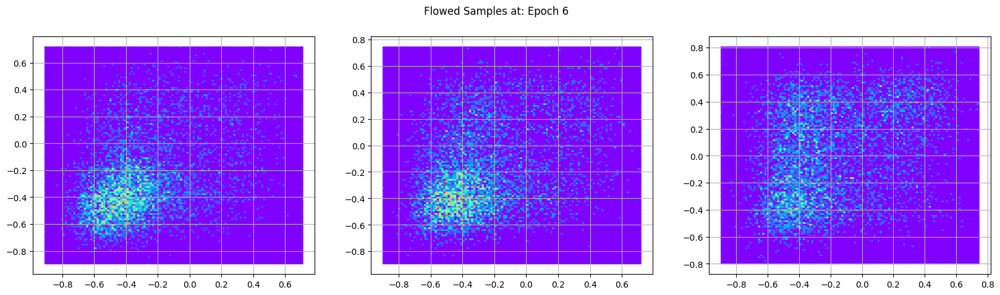

[ Epoch  6 ]:: ( Train Avg. Over Epoch ) = 332.74301205524375, ( Generalization ) = 326.66108270318057
[ ======== ]:: Report Learning Rate =  4.708808540532633e-05
[ ======== ]:: Report Norm of Gradient =  8829.651556917455
[ #### ]:: In training ...  ... (epoch7=>batch0)
[ #### ]:: In training ...  ... (epoch7=>batch10)
[ #### ]:: In training ...  ... (epoch7=>batch20)
[ #### ]:: In training ...  ... (epoch7=>batch30)
[ #### ]:: In training ...  ... (epoch7=>batch40)
[ #### ]:: In training ...  ... (epoch7=>batch50)
[ #### ]:: In training ...  ... (epoch7=>batch60)
[ #### ]:: In training ...  ... (epoch7=>batch70)
[ #### ]:: In training ...  ... (epoch7=>batch80)
[ #### ]:: In training ...  ... (epoch7=>batch90)
[ Epoch  7 ]:: ( Train Avg. Over Epoch ) = 324.3804440131547, ( Generalization ) = 319.6758870962276
[ ======== ]:: Report Learning Rate =  4.6619527815786177e-05
[ ======== ]:: Report Norm of Gradient =  8794.836535792696
[ #### ]:: In training ...  ... (epoch8=>batch0)
[ ###

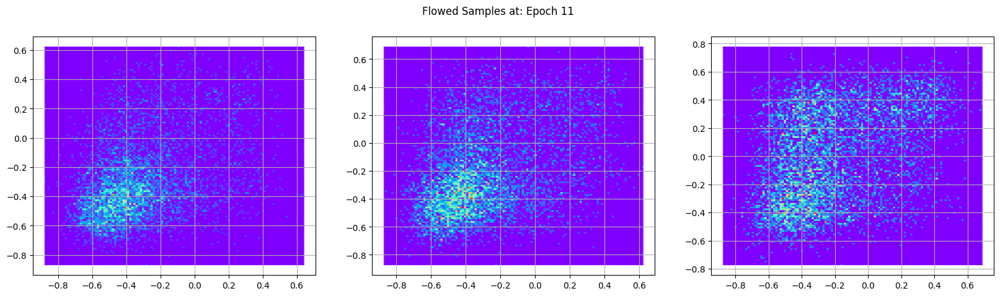

[ Epoch  11 ]:: ( Train Avg. Over Epoch ) = 306.95414128273603, ( Generalization ) = 304.21317332015013
[ ======== ]:: Report Learning Rate =  4.479146039469255e-05
[ ======== ]:: Report Norm of Gradient =  8697.307002384721
[ #### ]:: In training ...  ... (epoch12=>batch0)
[ #### ]:: In training ...  ... (epoch12=>batch10)
[ #### ]:: In training ...  ... (epoch12=>batch20)
[ #### ]:: In training ...  ... (epoch12=>batch30)
[ #### ]:: In training ...  ... (epoch12=>batch40)
[ #### ]:: In training ...  ... (epoch12=>batch50)
[ #### ]:: In training ...  ... (epoch12=>batch60)
[ #### ]:: In training ...  ... (epoch12=>batch70)
[ #### ]:: In training ...  ... (epoch12=>batch80)
[ #### ]:: In training ...  ... (epoch12=>batch90)
[ Epoch  12 ]:: ( Train Avg. Over Epoch ) = 304.3957408244125, ( Generalization ) = 301.5403153457648
[ ======== ]:: Report Learning Rate =  4.434575574278612e-05
[ ======== ]:: Report Norm of Gradient =  5675.525442126367
[ #### ]:: In training ...  ... (epoch13=>b

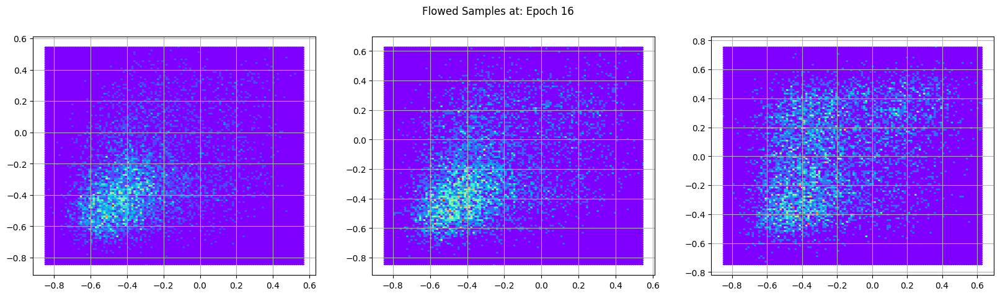

[ Epoch  16 ]:: ( Train Avg. Over Epoch ) = 293.9226507753849, ( Generalization ) = 291.8129695517076
[ ======== ]:: Report Learning Rate =  4.2606848569433875e-05
[ ======== ]:: Report Norm of Gradient =  4166.758906985995
[ #### ]:: In training ...  ... (epoch17=>batch0)
[ #### ]:: In training ...  ... (epoch17=>batch10)
[ #### ]:: In training ...  ... (epoch17=>batch20)
[ #### ]:: In training ...  ... (epoch17=>batch30)
[ #### ]:: In training ...  ... (epoch17=>batch40)
[ #### ]:: In training ...  ... (epoch17=>batch50)
[ #### ]:: In training ...  ... (epoch17=>batch60)
[ #### ]:: In training ...  ... (epoch17=>batch70)
[ #### ]:: In training ...  ... (epoch17=>batch80)
[ #### ]:: In training ...  ... (epoch17=>batch90)
[ Epoch  17 ]:: ( Train Avg. Over Epoch ) = 292.41187811981786, ( Generalization ) = 289.83984820228056
[ ======== ]:: Report Learning Rate =  4.218288224989144e-05
[ ======== ]:: Report Norm of Gradient =  5187.685529831186
[ #### ]:: In training ...  ... (epoch18=>

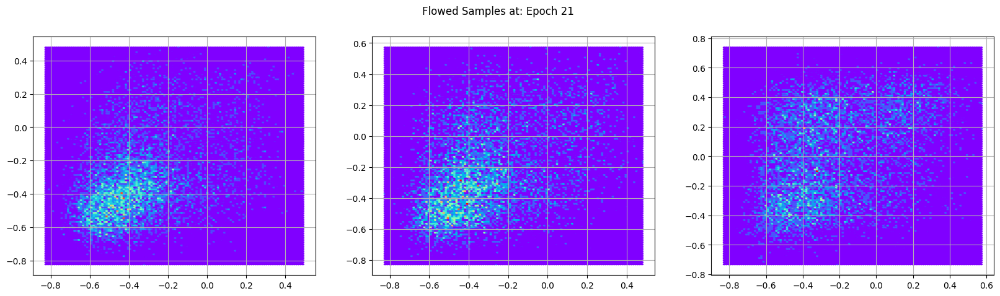

[ Epoch  21 ]:: ( Train Avg. Over Epoch ) = 286.16385814452747, ( Generalization ) = 283.16828513624284
[ ======== ]:: Report Learning Rate =  4.0528786715643215e-05
[ ======== ]:: Report Norm of Gradient =  4225.975864755572
[ #### ]:: In training ...  ... (epoch22=>batch0)
[ #### ]:: In training ...  ... (epoch22=>batch10)
[ #### ]:: In training ...  ... (epoch22=>batch20)
[ #### ]:: In training ...  ... (epoch22=>batch30)
[ #### ]:: In training ...  ... (epoch22=>batch40)
[ #### ]:: In training ...  ... (epoch22=>batch50)
[ #### ]:: In training ...  ... (epoch22=>batch60)
[ #### ]:: In training ...  ... (epoch22=>batch70)
[ #### ]:: In training ...  ... (epoch22=>batch80)
[ #### ]:: In training ...  ... (epoch22=>batch90)
[ Epoch  22 ]:: ( Train Avg. Over Epoch ) = 284.8123022119877, ( Generalization ) = 281.8382737995478
[ ======== ]:: Report Learning Rate =  4.012549848578623e-05
[ ======== ]:: Report Norm of Gradient =  7878.257256467798
[ #### ]:: In training ...  ... (epoch23=>

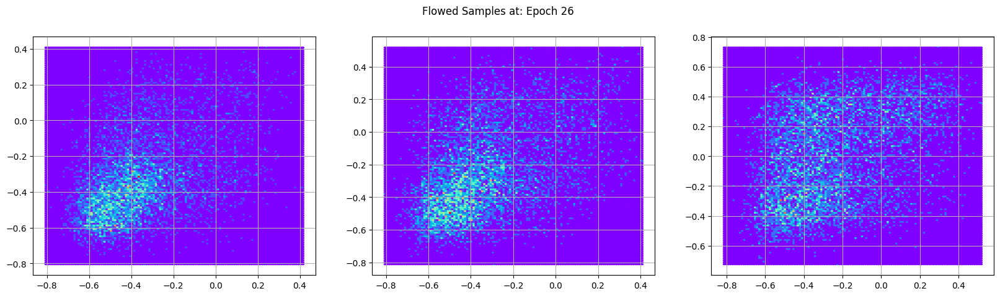

[ Epoch  26 ]:: ( Train Avg. Over Epoch ) = 279.7547139083095, ( Generalization ) = 277.20452808571855
[ ======== ]:: Report Learning Rate =  3.8552078076492137e-05
[ ======== ]:: Report Norm of Gradient =  5148.96860553524
[ #### ]:: In training ...  ... (epoch27=>batch0)
[ #### ]:: In training ...  ... (epoch27=>batch10)
[ #### ]:: In training ...  ... (epoch27=>batch20)
[ #### ]:: In training ...  ... (epoch27=>batch30)
[ #### ]:: In training ...  ... (epoch27=>batch40)
[ #### ]:: In training ...  ... (epoch27=>batch50)
[ #### ]:: In training ...  ... (epoch27=>batch60)
[ #### ]:: In training ...  ... (epoch27=>batch70)
[ #### ]:: In training ...  ... (epoch27=>batch80)
[ #### ]:: In training ...  ... (epoch27=>batch90)
[ Epoch  27 ]:: ( Train Avg. Over Epoch ) = 278.69180133513663, ( Generalization ) = 276.2651754303986
[ ======== ]:: Report Learning Rate =  3.816845940480919e-05
[ ======== ]:: Report Norm of Gradient =  8472.53707206887
[ #### ]:: In training ...  ... (epoch28=>ba

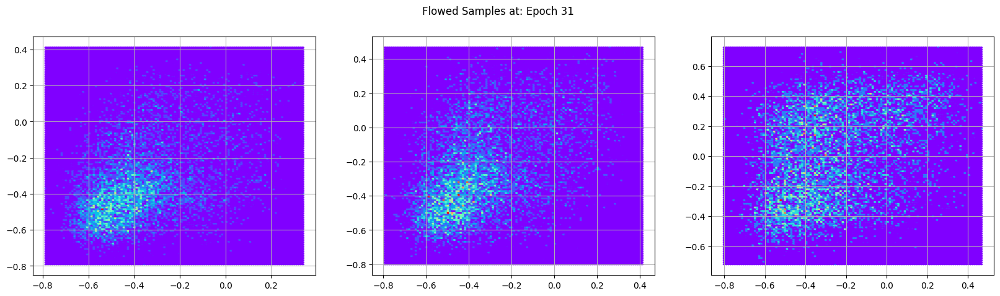

[ Epoch  31 ]:: ( Train Avg. Over Epoch ) = 275.2547629276279, ( Generalization ) = 272.79239899959504
[ ======== ]:: Report Learning Rate =  3.667177935633301e-05
[ ======== ]:: Report Norm of Gradient =  10594.572927330828
[ #### ]:: In training ...  ... (epoch32=>batch0)
[ #### ]:: In training ...  ... (epoch32=>batch10)
[ #### ]:: In training ...  ... (epoch32=>batch20)
[ #### ]:: In training ...  ... (epoch32=>batch30)
[ #### ]:: In training ...  ... (epoch32=>batch40)
[ #### ]:: In training ...  ... (epoch32=>batch50)
[ #### ]:: In training ...  ... (epoch32=>batch60)
[ #### ]:: In training ...  ... (epoch32=>batch70)
[ #### ]:: In training ...  ... (epoch32=>batch80)
[ #### ]:: In training ...  ... (epoch32=>batch90)
[ Epoch  32 ]:: ( Train Avg. Over Epoch ) = 274.12020004576146, ( Generalization ) = 272.00369665277384
[ ======== ]:: Report Learning Rate =  3.6306870900373405e-05
[ ======== ]:: Report Norm of Gradient =  5024.11337755491
[ #### ]:: In training ...  ... (epoch33=

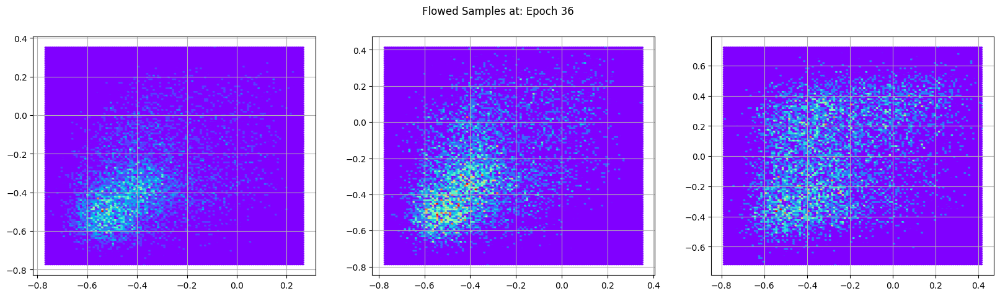

[ Epoch  36 ]:: ( Train Avg. Over Epoch ) = 271.48887579233957, ( Generalization ) = 269.10959449877345
[ ======== ]:: Report Learning Rate =  3.4883188358647776e-05
[ ======== ]:: Report Norm of Gradient =  16760.274051272198
[ #### ]:: In training ...  ... (epoch37=>batch0)
[ #### ]:: In training ...  ... (epoch37=>batch10)
[ #### ]:: In training ...  ... (epoch37=>batch20)
[ #### ]:: In training ...  ... (epoch37=>batch30)
[ #### ]:: In training ...  ... (epoch37=>batch40)
[ #### ]:: In training ...  ... (epoch37=>batch50)
[ #### ]:: In training ...  ... (epoch37=>batch60)
[ #### ]:: In training ...  ... (epoch37=>batch70)
[ #### ]:: In training ...  ... (epoch37=>batch80)
[ #### ]:: In training ...  ... (epoch37=>batch90)
[ Epoch  37 ]:: ( Train Avg. Over Epoch ) = 270.9093360827691, ( Generalization ) = 268.57654450338987
[ ======== ]:: Report Learning Rate =  3.4536077565925765e-05
[ ======== ]:: Report Norm of Gradient =  19977.042840903632
[ #### ]:: In training ...  ... (epoch

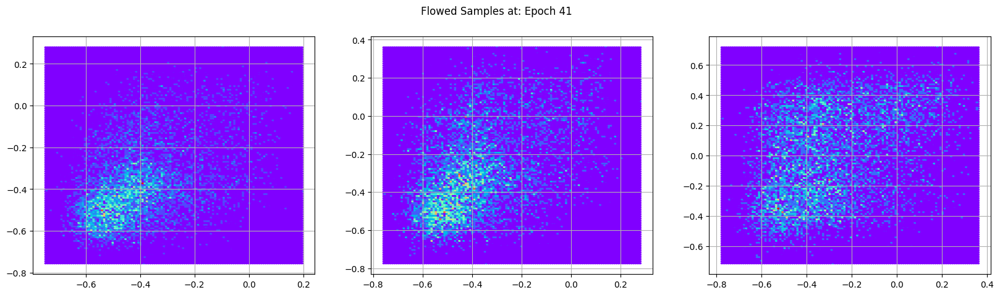

[ Epoch  41 ]:: ( Train Avg. Over Epoch ) = 268.41619516049957, ( Generalization ) = 266.26119568353135
[ ======== ]:: Report Learning Rate =  3.318183222693166e-05
[ ======== ]:: Report Norm of Gradient =  2884.7727374097976
[ #### ]:: In training ...  ... (epoch42=>batch0)
[ #### ]:: In training ...  ... (epoch42=>batch10)
[ #### ]:: In training ...  ... (epoch42=>batch20)
[ #### ]:: In training ...  ... (epoch42=>batch30)
[ #### ]:: In training ...  ... (epoch42=>batch40)
[ #### ]:: In training ...  ... (epoch42=>batch50)
[ #### ]:: In training ...  ... (epoch42=>batch60)
[ #### ]:: In training ...  ... (epoch42=>batch70)
[ #### ]:: In training ...  ... (epoch42=>batch80)
[ #### ]:: In training ...  ... (epoch42=>batch90)
[ Epoch  42 ]:: ( Train Avg. Over Epoch ) = 267.9690899907584, ( Generalization ) = 265.68205037024467
[ ======== ]:: Report Learning Rate =  3.2851651052841746e-05
[ ======== ]:: Report Norm of Gradient =  7264.057503368815
[ #### ]:: In training ...  ... (epoch43

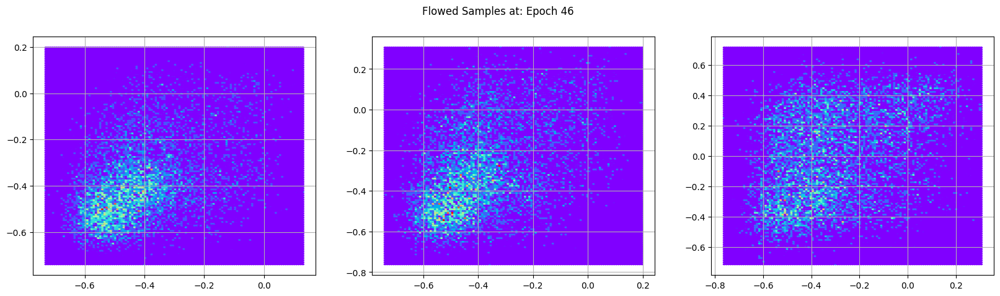

[ Epoch  46 ]:: ( Train Avg. Over Epoch ) = 266.03542827591014, ( Generalization ) = 263.753788850109
[ ======== ]:: Report Learning Rate =  3.1563456259103336e-05
[ ======== ]:: Report Norm of Gradient =  21396.124845557257
[ #### ]:: In training ...  ... (epoch47=>batch0)
[ #### ]:: In training ...  ... (epoch47=>batch10)
[ #### ]:: In training ...  ... (epoch47=>batch20)
[ #### ]:: In training ...  ... (epoch47=>batch30)
[ #### ]:: In training ...  ... (epoch47=>batch40)
[ #### ]:: In training ...  ... (epoch47=>batch50)
[ #### ]:: In training ...  ... (epoch47=>batch60)
[ #### ]:: In training ...  ... (epoch47=>batch70)
[ #### ]:: In training ...  ... (epoch47=>batch80)
[ #### ]:: In training ...  ... (epoch47=>batch90)
[ Epoch  47 ]:: ( Train Avg. Over Epoch ) = 265.1362747666744, ( Generalization ) = 263.3426318893364
[ ======== ]:: Report Learning Rate =  3.1249378996139314e-05
[ ======== ]:: Report Norm of Gradient =  4514.59845409189
[ #### ]:: In training ...  ... (epoch48=>b

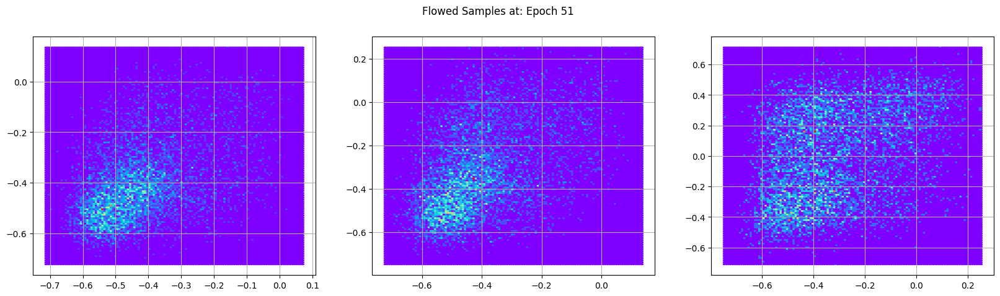

[ Epoch  51 ]:: ( Train Avg. Over Epoch ) = 262.99015693876146, ( Generalization ) = 261.4270513047523
[ ======== ]:: Report Learning Rate =  3.0024013267469147e-05
[ ======== ]:: Report Norm of Gradient =  6443.989570533051
[ #### ]:: In training ...  ... (epoch52=>batch0)
[ #### ]:: In training ...  ... (epoch52=>batch10)
[ #### ]:: In training ...  ... (epoch52=>batch20)
[ #### ]:: In training ...  ... (epoch52=>batch30)
[ #### ]:: In training ...  ... (epoch52=>batch40)
[ #### ]:: In training ...  ... (epoch52=>batch50)
[ #### ]:: In training ...  ... (epoch52=>batch60)
[ #### ]:: In training ...  ... (epoch52=>batch70)
[ #### ]:: In training ...  ... (epoch52=>batch80)
[ #### ]:: In training ...  ... (epoch52=>batch90)
[ Epoch  52 ]:: ( Train Avg. Over Epoch ) = 262.8607372653741, ( Generalization ) = 260.98867962800233
[ ======== ]:: Report Learning Rate =  2.9725254480318797e-05
[ ======== ]:: Report Norm of Gradient =  195355.18131529097
[ #### ]:: In training ...  ... (epoch53

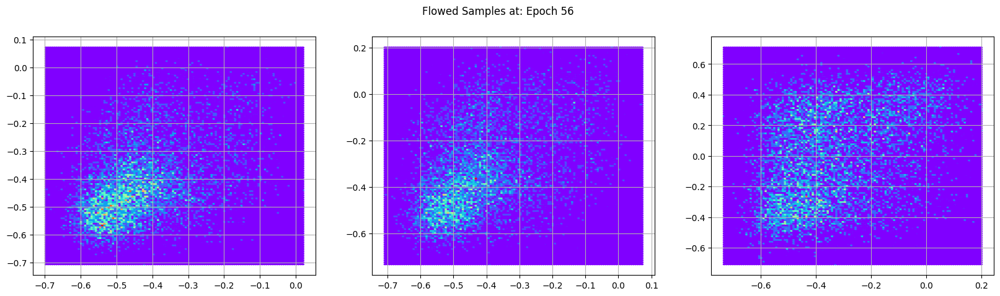

[ Epoch  56 ]:: ( Train Avg. Over Epoch ) = 260.7469566854152, ( Generalization ) = 259.5682326551903
[ ======== ]:: Report Learning Rate =  2.8559653457633434e-05
[ ======== ]:: Report Norm of Gradient =  4371.946531101615
[ #### ]:: In training ...  ... (epoch57=>batch0)
[ #### ]:: In training ...  ... (epoch57=>batch10)
[ #### ]:: In training ...  ... (epoch57=>batch20)
[ #### ]:: In training ...  ... (epoch57=>batch30)
[ #### ]:: In training ...  ... (epoch57=>batch40)
[ #### ]:: In training ...  ... (epoch57=>batch50)
[ #### ]:: In training ...  ... (epoch57=>batch60)
[ #### ]:: In training ...  ... (epoch57=>batch70)
[ #### ]:: In training ...  ... (epoch57=>batch80)
[ #### ]:: In training ...  ... (epoch57=>batch90)
[ Epoch  57 ]:: ( Train Avg. Over Epoch ) = 260.49581716845677, ( Generalization ) = 259.29288455652204
[ ======== ]:: Report Learning Rate =  2.8275466018984757e-05
[ ======== ]:: Report Norm of Gradient =  12172.503265222611
[ #### ]:: In training ...  ... (epoch58

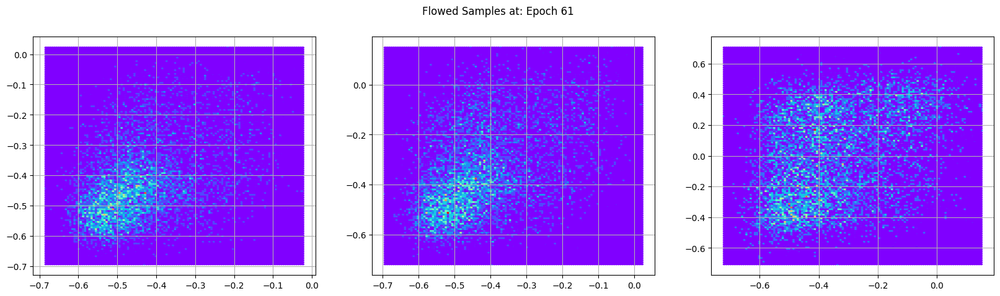

[ Epoch  61 ]:: ( Train Avg. Over Epoch ) = 259.56221777489424, ( Generalization ) = 257.9418298022577
[ ======== ]:: Report Learning Rate =  2.716671480104463e-05
[ ======== ]:: Report Norm of Gradient =  3837.095172068046
[ #### ]:: In training ...  ... (epoch62=>batch0)
[ #### ]:: In training ...  ... (epoch62=>batch10)
[ #### ]:: In training ...  ... (epoch62=>batch20)
[ #### ]:: In training ...  ... (epoch62=>batch30)
[ #### ]:: In training ...  ... (epoch62=>batch40)
[ #### ]:: In training ...  ... (epoch62=>batch50)
[ #### ]:: In training ...  ... (epoch62=>batch60)
[ #### ]:: In training ...  ... (epoch62=>batch70)
[ #### ]:: In training ...  ... (epoch62=>batch80)
[ #### ]:: In training ...  ... (epoch62=>batch90)
[ Epoch  62 ]:: ( Train Avg. Over Epoch ) = 259.20032422793133, ( Generalization ) = 257.6500406225004
[ ======== ]:: Report Learning Rate =  2.689638802319134e-05
[ ======== ]:: Report Norm of Gradient =  2794.5285695684092
[ #### ]:: In training ...  ... (epoch63=>

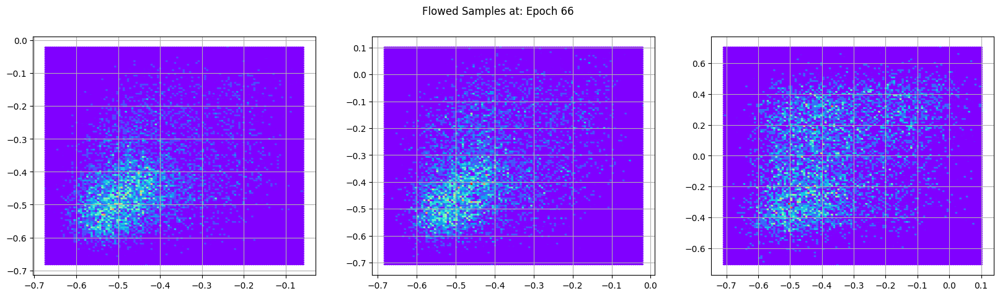

[ Epoch  66 ]:: ( Train Avg. Over Epoch ) = 258.1058186420814, ( Generalization ) = 256.6780363652619
[ ======== ]:: Report Learning Rate =  2.58417138771001e-05
[ ======== ]:: Report Norm of Gradient =  3039.209236826472
[ #### ]:: In training ...  ... (epoch67=>batch0)
[ #### ]:: In training ...  ... (epoch67=>batch10)
[ #### ]:: In training ...  ... (epoch67=>batch20)
[ #### ]:: In training ...  ... (epoch67=>batch30)
[ #### ]:: In training ...  ... (epoch67=>batch40)
[ #### ]:: In training ...  ... (epoch67=>batch50)
[ #### ]:: In training ...  ... (epoch67=>batch60)
[ #### ]:: In training ...  ... (epoch67=>batch70)
[ #### ]:: In training ...  ... (epoch67=>batch80)
[ #### ]:: In training ...  ... (epoch67=>batch90)
[ Epoch  67 ]:: ( Train Avg. Over Epoch ) = 258.0151066906308, ( Generalization ) = 256.45982020462384
[ ======== ]:: Report Learning Rate =  2.5584571734674596e-05
[ ======== ]:: Report Norm of Gradient =  868586.2580645118
[ #### ]:: In training ...  ... (epoch68=>ba

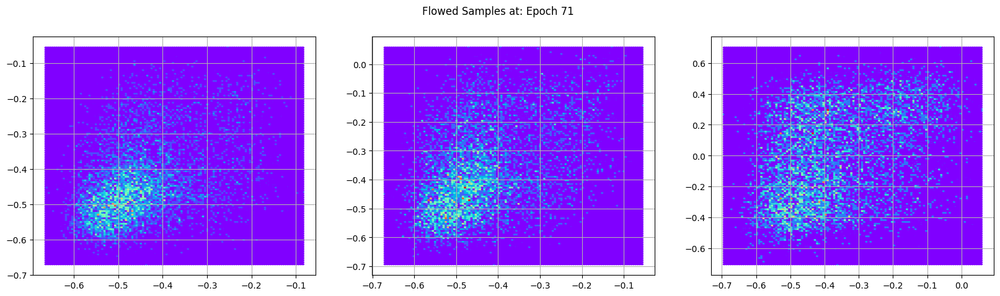

[ Epoch  71 ]:: ( Train Avg. Over Epoch ) = 257.55994021296897, ( Generalization ) = 255.73733255159087
[ ======== ]:: Report Learning Rate =  2.4581337161909236e-05
[ ======== ]:: Report Norm of Gradient =  7902.767274738013
[ #### ]:: In training ...  ... (epoch72=>batch0)
[ #### ]:: In training ...  ... (epoch72=>batch10)
[ #### ]:: In training ...  ... (epoch72=>batch20)
[ #### ]:: In training ...  ... (epoch72=>batch30)
[ #### ]:: In training ...  ... (epoch72=>batch40)
[ #### ]:: In training ...  ... (epoch72=>batch50)
[ #### ]:: In training ...  ... (epoch72=>batch60)
[ #### ]:: In training ...  ... (epoch72=>batch70)
[ #### ]:: In training ...  ... (epoch72=>batch80)
[ #### ]:: In training ...  ... (epoch72=>batch90)
[ Epoch  72 ]:: ( Train Avg. Over Epoch ) = 256.71149326910415, ( Generalization ) = 255.6806270719099
[ ======== ]:: Report Learning Rate =  2.4336736601297893e-05
[ ======== ]:: Report Norm of Gradient =  2046.215413848412
[ #### ]:: In training ...  ... (epoch73

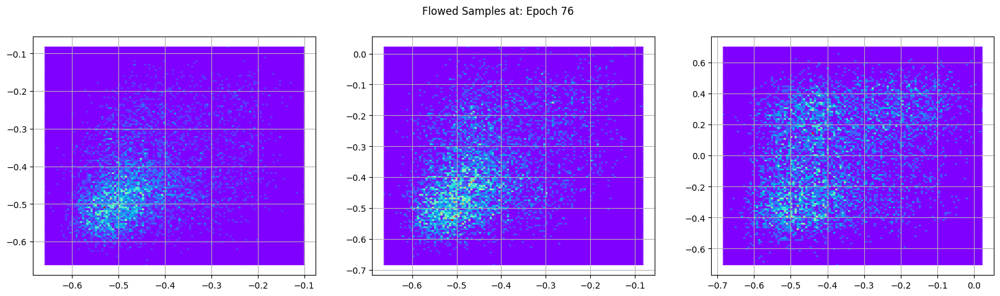

[ Epoch  76 ]:: ( Train Avg. Over Epoch ) = 256.7379201725915, ( Generalization ) = 255.01708523692085
[ ======== ]:: Report Learning Rate =  2.3382432741928792e-05
[ ======== ]:: Report Norm of Gradient =  4070.5448587867095
[ #### ]:: In training ...  ... (epoch77=>batch0)
[ #### ]:: In training ...  ... (epoch77=>batch10)
[ #### ]:: In training ...  ... (epoch77=>batch20)
[ #### ]:: In training ...  ... (epoch77=>batch30)
[ #### ]:: In training ...  ... (epoch77=>batch40)
[ #### ]:: In training ...  ... (epoch77=>batch50)
[ #### ]:: In training ...  ... (epoch77=>batch60)
[ #### ]:: In training ...  ... (epoch77=>batch70)
[ #### ]:: In training ...  ... (epoch77=>batch80)
[ #### ]:: In training ...  ... (epoch77=>batch90)
[ Epoch  77 ]:: ( Train Avg. Over Epoch ) = 256.52103764077145, ( Generalization ) = 255.01278231019342
[ ======== ]:: Report Learning Rate =  2.314976207314208e-05
[ ======== ]:: Report Norm of Gradient =  1263.4250623875741
[ #### ]:: In training ...  ... (epoch7

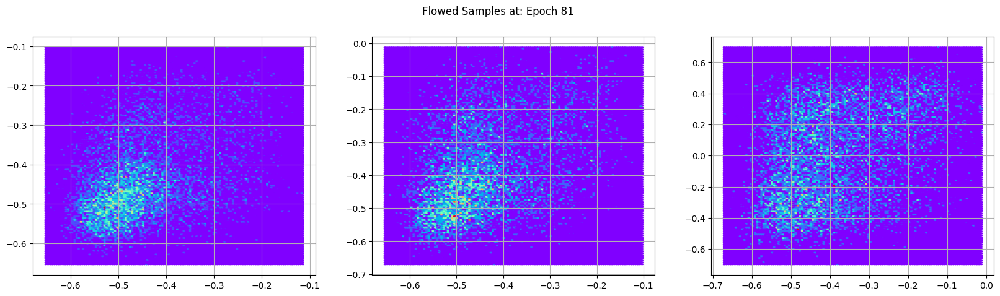

[ Epoch  81 ]:: ( Train Avg. Over Epoch ) = 256.0178581742421, ( Generalization ) = 254.76483295743103
[ ======== ]:: Report Learning Rate =  2.2242002431748784e-05
[ ======== ]:: Report Norm of Gradient =  7373.340904409766
[ #### ]:: In training ...  ... (epoch82=>batch0)
[ #### ]:: In training ...  ... (epoch82=>batch10)
[ #### ]:: In training ...  ... (epoch82=>batch20)
[ #### ]:: In training ...  ... (epoch82=>batch30)
[ #### ]:: In training ...  ... (epoch82=>batch40)
[ #### ]:: In training ...  ... (epoch82=>batch50)
[ #### ]:: In training ...  ... (epoch82=>batch60)
[ #### ]:: In training ...  ... (epoch82=>batch70)
[ #### ]:: In training ...  ... (epoch82=>batch80)
[ #### ]:: In training ...  ... (epoch82=>batch90)
[ Epoch  82 ]:: ( Train Avg. Over Epoch ) = 255.90939530595813, ( Generalization ) = 254.56617483288397
[ ======== ]:: Report Learning Rate =  2.2020679798724768e-05
[ ======== ]:: Report Norm of Gradient =  42983.71998523564
[ #### ]:: In training ...  ... (epoch83

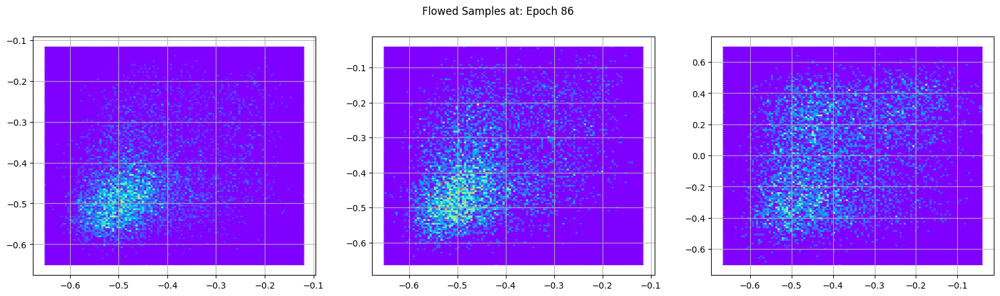

[ Epoch  86 ]:: ( Train Avg. Over Epoch ) = 255.82826771358802, ( Generalization ) = 254.38550758674134
[ ======== ]:: Report Learning Rate =  2.1157194276317697e-05
[ ======== ]:: Report Norm of Gradient =  1886.3618825726835
[ #### ]:: In training ...  ... (epoch87=>batch0)
[ #### ]:: In training ...  ... (epoch87=>batch10)
[ #### ]:: In training ...  ... (epoch87=>batch20)
[ #### ]:: In training ...  ... (epoch87=>batch30)
[ #### ]:: In training ...  ... (epoch87=>batch40)
[ #### ]:: In training ...  ... (epoch87=>batch50)
[ #### ]:: In training ...  ... (epoch87=>batch60)
[ #### ]:: In training ...  ... (epoch87=>batch70)
[ #### ]:: In training ...  ... (epoch87=>batch80)
[ #### ]:: In training ...  ... (epoch87=>batch90)
[ Epoch  87 ]:: ( Train Avg. Over Epoch ) = 255.43354585939738, ( Generalization ) = 254.2602351521199
[ ======== ]:: Report Learning Rate =  2.0946666201833227e-05
[ ======== ]:: Report Norm of Gradient =  11770.38739872444
[ #### ]:: In training ...  ... (epoch8

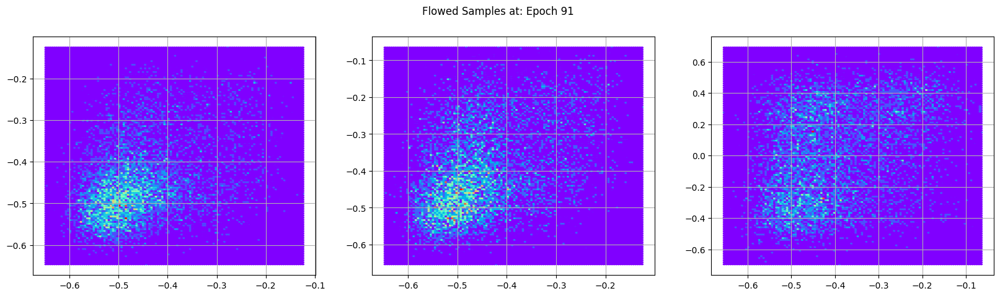

[ Epoch  91 ]:: ( Train Avg. Over Epoch ) = 255.56989459092932, ( Generalization ) = 254.07096972572305
[ ======== ]:: Report Learning Rate =  2.0125295418855707e-05
[ ======== ]:: Report Norm of Gradient =  970.5759154598267
[ #### ]:: In training ...  ... (epoch92=>batch0)
[ #### ]:: In training ...  ... (epoch92=>batch10)
[ #### ]:: In training ...  ... (epoch92=>batch20)
[ #### ]:: In training ...  ... (epoch92=>batch30)
[ #### ]:: In training ...  ... (epoch92=>batch40)
[ #### ]:: In training ...  ... (epoch92=>batch50)
[ #### ]:: In training ...  ... (epoch92=>batch60)
[ #### ]:: In training ...  ... (epoch92=>batch70)
[ #### ]:: In training ...  ... (epoch92=>batch80)
[ #### ]:: In training ...  ... (epoch92=>batch90)
[ Epoch  92 ]:: ( Train Avg. Over Epoch ) = 255.69367836000387, ( Generalization ) = 254.06413506991058
[ ======== ]:: Report Learning Rate =  1.9925035420406588e-05
[ ======== ]:: Report Norm of Gradient =  236266.4265235677
[ #### ]:: In training ...  ... (epoch9

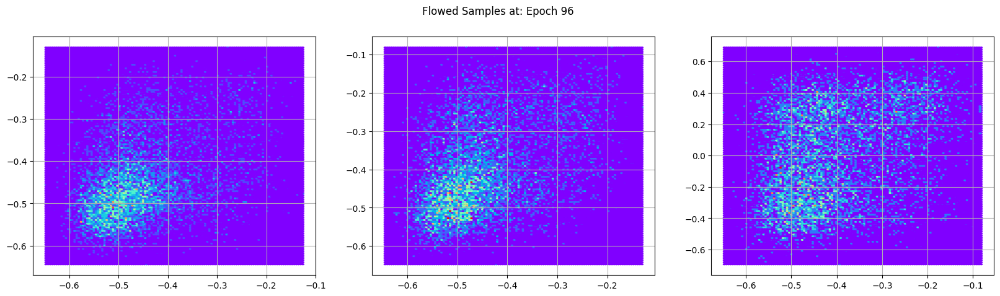

[ Epoch  96 ]:: ( Train Avg. Over Epoch ) = 255.15497482468294, ( Generalization ) = 253.91123455887333
[ ======== ]:: Report Learning Rate =  1.9143725316621105e-05
[ ======== ]:: Report Norm of Gradient =  5222.283092923513
[ #### ]:: In training ...  ... (epoch97=>batch0)
[ #### ]:: In training ...  ... (epoch97=>batch10)
[ #### ]:: In training ...  ... (epoch97=>batch20)
[ #### ]:: In training ...  ... (epoch97=>batch30)
[ #### ]:: In training ...  ... (epoch97=>batch40)
[ #### ]:: In training ...  ... (epoch97=>batch50)
[ #### ]:: In training ...  ... (epoch97=>batch60)
[ #### ]:: In training ...  ... (epoch97=>batch70)
[ #### ]:: In training ...  ... (epoch97=>batch80)
[ #### ]:: In training ...  ... (epoch97=>batch90)
[ Epoch  97 ]:: ( Train Avg. Over Epoch ) = 255.17044617417807, ( Generalization ) = 253.939157819451
[ ======== ]:: Report Learning Rate =  1.8953232589810015e-05
[ ======== ]:: Report Norm of Gradient =  3179.664096466211
[ #### ]:: In training ...  ... (epoch98=

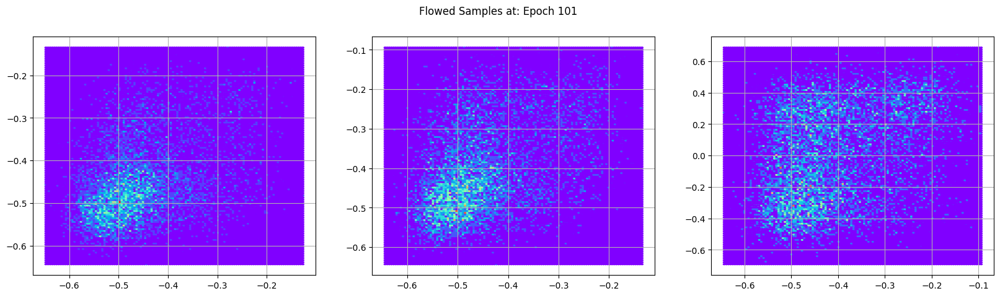

[ Epoch  101 ]:: ( Train Avg. Over Epoch ) = 254.96661766180648, ( Generalization ) = 253.86785520756646
[ ======== ]:: Report Learning Rate =  1.8210029287563995e-05
[ ======== ]:: Report Norm of Gradient =  2902.8054044085666
[ #### ]:: In training ...  ... (epoch102=>batch0)
[ #### ]:: In training ...  ... (epoch102=>batch10)
[ #### ]:: In training ...  ... (epoch102=>batch20)
[ #### ]:: In training ...  ... (epoch102=>batch30)
[ #### ]:: In training ...  ... (epoch102=>batch40)
[ #### ]:: In training ...  ... (epoch102=>batch50)
[ #### ]:: In training ...  ... (epoch102=>batch60)
[ #### ]:: In training ...  ... (epoch102=>batch70)
[ #### ]:: In training ...  ... (epoch102=>batch80)
[ #### ]:: In training ...  ... (epoch102=>batch90)
[ Epoch  102 ]:: ( Train Avg. Over Epoch ) = 255.43132643349898, ( Generalization ) = 253.84327953190308
[ ======== ]:: Report Learning Rate =  1.802882745370324e-05
[ ======== ]:: Report Norm of Gradient =  2827.3609333701615
[ #### ]:: In training ...

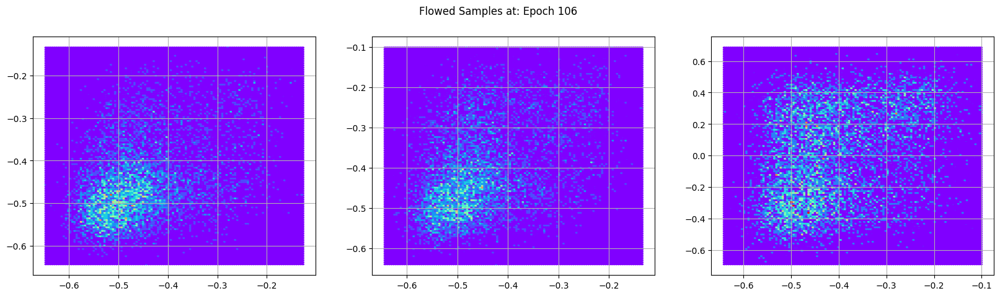

[ Epoch  106 ]:: ( Train Avg. Over Epoch ) = 255.1206510621248, ( Generalization ) = 253.71641000608642
[ ======== ]:: Report Learning Rate =  1.7321872371728464e-05
[ ======== ]:: Report Norm of Gradient =  2402.1473728030915
[ #### ]:: In training ...  ... (epoch107=>batch0)
[ #### ]:: In training ...  ... (epoch107=>batch10)
[ #### ]:: In training ...  ... (epoch107=>batch20)
[ #### ]:: In training ...  ... (epoch107=>batch30)
[ #### ]:: In training ...  ... (epoch107=>batch40)
[ #### ]:: In training ...  ... (epoch107=>batch50)
[ #### ]:: In training ...  ... (epoch107=>batch60)
[ #### ]:: In training ...  ... (epoch107=>batch70)
[ #### ]:: In training ...  ... (epoch107=>batch80)
[ #### ]:: In training ...  ... (epoch107=>batch90)
[ Epoch  107 ]:: ( Train Avg. Over Epoch ) = 255.60971643656623, ( Generalization ) = 253.744045928608
[ ======== ]:: Report Learning Rate =  1.714950828652609e-05
[ ======== ]:: Report Norm of Gradient =  1867.1517789861248
[ #### ]:: In training ...  .

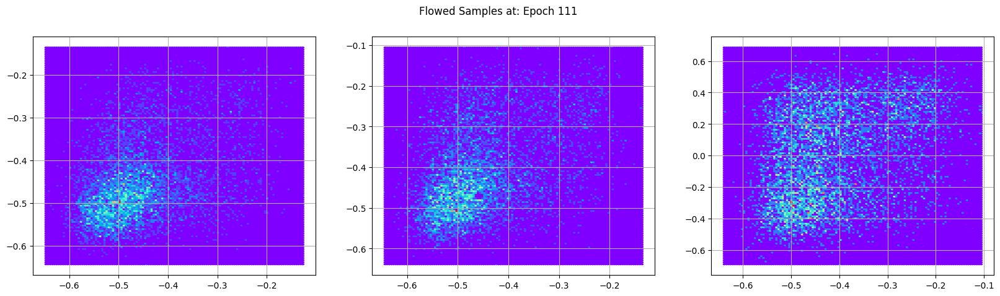

[ Epoch  111 ]:: ( Train Avg. Over Epoch ) = 254.81650844238976, ( Generalization ) = 253.6788443886894
[ ======== ]:: Report Learning Rate =  1.647703349205253e-05
[ ======== ]:: Report Norm of Gradient =  1061.6330012989597
[ #### ]:: In training ...  ... (epoch112=>batch0)
[ #### ]:: In training ...  ... (epoch112=>batch10)
[ #### ]:: In training ...  ... (epoch112=>batch20)
[ #### ]:: In training ...  ... (epoch112=>batch30)
[ #### ]:: In training ...  ... (epoch112=>batch40)
[ #### ]:: In training ...  ... (epoch112=>batch50)
[ #### ]:: In training ...  ... (epoch112=>batch60)
[ #### ]:: In training ...  ... (epoch112=>batch70)
[ #### ]:: In training ...  ... (epoch112=>batch80)
[ #### ]:: In training ...  ... (epoch112=>batch90)
[ Epoch  112 ]:: ( Train Avg. Over Epoch ) = 254.96223033117587, ( Generalization ) = 253.73230159463023
[ ======== ]:: Report Learning Rate =  1.6313076112402196e-05
[ ======== ]:: Report Norm of Gradient =  172317.95753611036
[ #### ]:: In training ... 

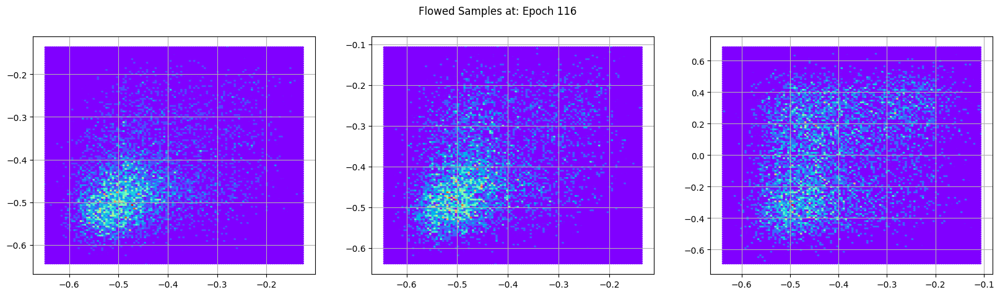

[ Epoch  116 ]:: ( Train Avg. Over Epoch ) = 255.28508803105268, ( Generalization ) = 253.65421924055576
[ ======== ]:: Report Learning Rate =  1.5673399899963045e-05
[ ======== ]:: Report Norm of Gradient =  2007126.0704388092
[ #### ]:: In training ...  ... (epoch117=>batch0)
[ #### ]:: In training ...  ... (epoch117=>batch10)
[ #### ]:: In training ...  ... (epoch117=>batch20)
[ #### ]:: In training ...  ... (epoch117=>batch30)
[ #### ]:: In training ...  ... (epoch117=>batch40)
[ #### ]:: In training ...  ... (epoch117=>batch50)
[ #### ]:: In training ...  ... (epoch117=>batch60)
[ #### ]:: In training ...  ... (epoch117=>batch70)
[ #### ]:: In training ...  ... (epoch117=>batch80)
[ #### ]:: In training ...  ... (epoch117=>batch90)
[ Epoch  117 ]:: ( Train Avg. Over Epoch ) = 254.91320081803266, ( Generalization ) = 253.6327518407114
[ ======== ]:: Report Learning Rate =  1.5517439206003822e-05
[ ======== ]:: Report Norm of Gradient =  467583.16828986286
[ #### ]:: In training ...

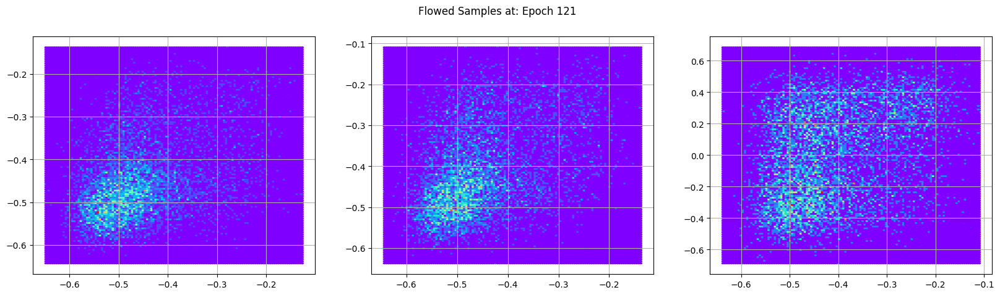

[ Epoch  121 ]:: ( Train Avg. Over Epoch ) = 255.43377351512999, ( Generalization ) = 253.62635187241455
[ ======== ]:: Report Learning Rate =  1.4908961891875145e-05
[ ======== ]:: Report Norm of Gradient =  22814.807641394527
[ #### ]:: In training ...  ... (epoch122=>batch0)
[ #### ]:: In training ...  ... (epoch122=>batch10)
[ #### ]:: In training ...  ... (epoch122=>batch20)
[ #### ]:: In training ...  ... (epoch122=>batch30)
[ #### ]:: In training ...  ... (epoch122=>batch40)
[ #### ]:: In training ...  ... (epoch122=>batch50)
[ #### ]:: In training ...  ... (epoch122=>batch60)
[ #### ]:: In training ...  ... (epoch122=>batch70)
[ #### ]:: In training ...  ... (epoch122=>batch80)
[ #### ]:: In training ...  ... (epoch122=>batch90)
[ Epoch  122 ]:: ( Train Avg. Over Epoch ) = 255.1599098023791, ( Generalization ) = 253.62209420756128
[ ======== ]:: Report Learning Rate =  1.476060786162585e-05
[ ======== ]:: Report Norm of Gradient =  123627.5017759332
[ #### ]:: In training ...  

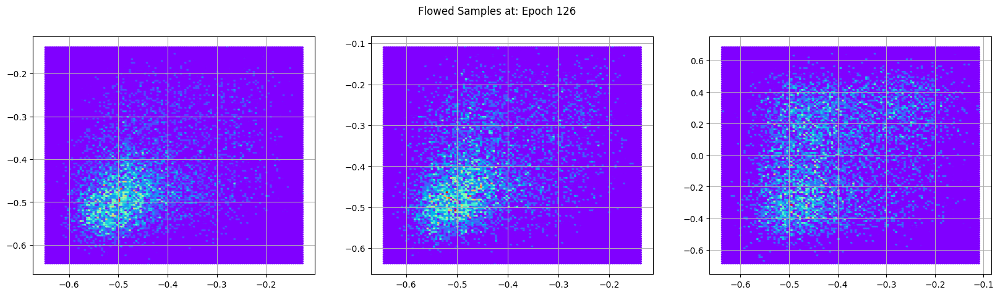

[ Epoch  126 ]:: ( Train Avg. Over Epoch ) = 254.58664573975534, ( Generalization ) = 253.61258923035427
[ ======== ]:: Report Learning Rate =  1.4181807783383938e-05
[ ======== ]:: Report Norm of Gradient =  3612.3705814611894
[ #### ]:: In training ...  ... (epoch127=>batch0)
[ #### ]:: In training ...  ... (epoch127=>batch10)
[ #### ]:: In training ...  ... (epoch127=>batch20)
[ #### ]:: In training ...  ... (epoch127=>batch30)
[ #### ]:: In training ...  ... (epoch127=>batch40)
[ #### ]:: In training ...  ... (epoch127=>batch50)
[ #### ]:: In training ...  ... (epoch127=>batch60)
[ #### ]:: In training ...  ... (epoch127=>batch70)
[ #### ]:: In training ...  ... (epoch127=>batch80)
[ #### ]:: In training ...  ... (epoch127=>batch90)
[ Epoch  127 ]:: ( Train Avg. Over Epoch ) = 255.1013807096588, ( Generalization ) = 253.5686132706871
[ ======== ]:: Report Learning Rate =  1.4040689417387424e-05
[ ======== ]:: Report Norm of Gradient =  5131.193086099778
[ #### ]:: In training ...  

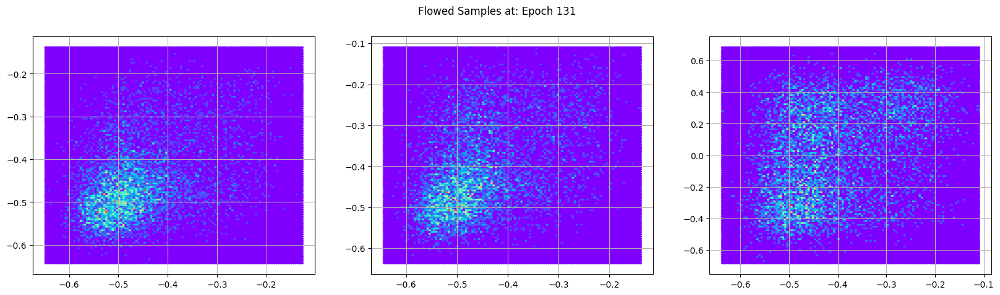

[ Epoch  131 ]:: ( Train Avg. Over Epoch ) = 255.2834338110129, ( Generalization ) = 253.59240352874193
[ ======== ]:: Report Learning Rate =  1.3490119128579622e-05
[ ======== ]:: Report Norm of Gradient =  395836.2140608154
[ #### ]:: In training ...  ... (epoch132=>batch0)
[ #### ]:: In training ...  ... (epoch132=>batch10)
[ #### ]:: In training ...  ... (epoch132=>batch20)
[ #### ]:: In training ...  ... (epoch132=>batch30)
[ #### ]:: In training ...  ... (epoch132=>batch40)
[ #### ]:: In training ...  ... (epoch132=>batch50)
[ #### ]:: In training ...  ... (epoch132=>batch60)
[ #### ]:: In training ...  ... (epoch132=>batch70)
[ #### ]:: In training ...  ... (epoch132=>batch80)
[ #### ]:: In training ...  ... (epoch132=>batch90)
[ Epoch  132 ]:: ( Train Avg. Over Epoch ) = 255.14944635528317, ( Generalization ) = 253.6801162713805
[ ======== ]:: Report Learning Rate =  1.335588352211809e-05
[ ======== ]:: Report Norm of Gradient =  25571.61468318197
[ #### ]:: In training ...  ..

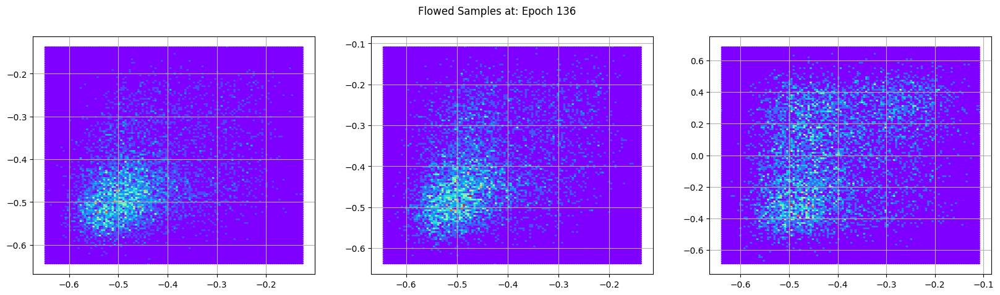

[ Epoch  136 ]:: ( Train Avg. Over Epoch ) = 255.21944468686237, ( Generalization ) = 253.54254504315568
[ ======== ]:: Report Learning Rate =  1.2832166172530553e-05
[ ======== ]:: Report Norm of Gradient =  2133.6953971831717
[ #### ]:: In training ...  ... (epoch137=>batch0)
[ #### ]:: In training ...  ... (epoch137=>batch10)
[ #### ]:: In training ...  ... (epoch137=>batch20)
[ #### ]:: In training ...  ... (epoch137=>batch30)
[ #### ]:: In training ...  ... (epoch137=>batch40)
[ #### ]:: In training ...  ... (epoch137=>batch50)
[ #### ]:: In training ...  ... (epoch137=>batch60)
[ #### ]:: In training ...  ... (epoch137=>batch70)
[ #### ]:: In training ...  ... (epoch137=>batch80)
[ #### ]:: In training ...  ... (epoch137=>batch90)
[ Epoch  137 ]:: ( Train Avg. Over Epoch ) = 254.79545658678876, ( Generalization ) = 253.5624567666704
[ ======== ]:: Report Learning Rate =  1.2704477633091672e-05
[ ======== ]:: Report Norm of Gradient =  4156.739392435057
[ #### ]:: In training ... 

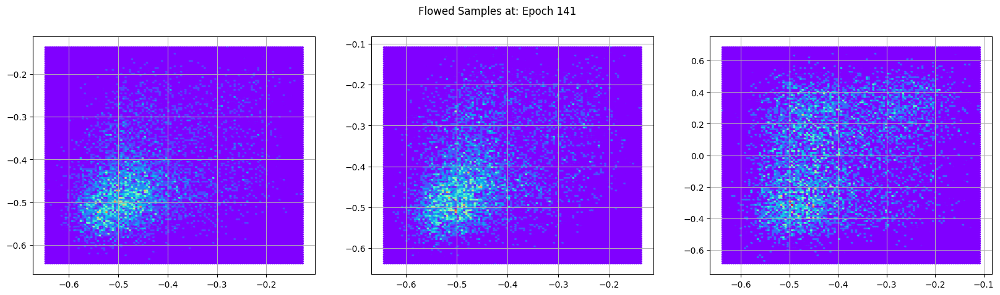

[ Epoch  141 ]:: ( Train Avg. Over Epoch ) = 254.61711080225697, ( Generalization ) = 253.58282088633092
[ ======== ]:: Report Learning Rate =  1.2206303525562334e-05
[ ======== ]:: Report Norm of Gradient =  1139.9241057419272
[ #### ]:: In training ...  ... (epoch142=>batch0)
[ #### ]:: In training ...  ... (epoch142=>batch10)
[ #### ]:: In training ...  ... (epoch142=>batch20)
[ #### ]:: In training ...  ... (epoch142=>batch30)
[ #### ]:: In training ...  ... (epoch142=>batch40)
[ #### ]:: In training ...  ... (epoch142=>batch50)
[ #### ]:: In training ...  ... (epoch142=>batch60)
[ #### ]:: In training ...  ... (epoch142=>batch70)
[ #### ]:: In training ...  ... (epoch142=>batch80)
[ #### ]:: In training ...  ... (epoch142=>batch90)
[ Epoch  142 ]:: ( Train Avg. Over Epoch ) = 254.92942149212323, ( Generalization ) = 253.5251023021865
[ ======== ]:: Report Learning Rate =  1.2084842733349154e-05
[ ======== ]:: Report Norm of Gradient =  3124.112630018324
[ #### ]:: In training ... 

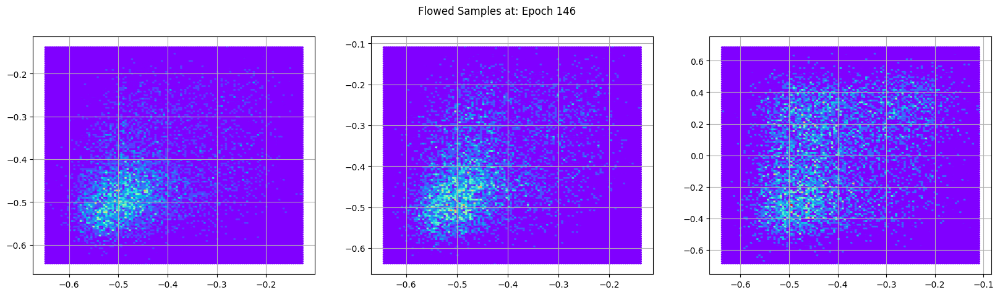

[ Epoch  146 ]:: ( Train Avg. Over Epoch ) = 255.28466727208018, ( Generalization ) = 253.50724344308995
[ ======== ]:: Report Learning Rate =  1.1610966048515059e-05
[ ======== ]:: Report Norm of Gradient =  12638.963308323819
[ #### ]:: In training ...  ... (epoch147=>batch0)
[ #### ]:: In training ...  ... (epoch147=>batch10)
[ #### ]:: In training ...  ... (epoch147=>batch20)


In [ ]:
for seed in np.arange(1):
    np.random.seed(seed)
    torch.manual_seed(seed)
    print("Running seed {}".format(seed))
    # load tensorizing flow dataset
    ginz2d_tf_dataset = utils.datasets.TensorizingFlowDataset("gl2d_samples_rk3.mat", gaussian_data=False)
    # initialize NF model
    ginz2d_flow = NormalizingFlow(dim=ginz2d_tf_dataset.dim, blocks=RESNET_BLOCKS2_GL2D2, \
                                flow_length=4)
    # target PDF function
    ginz2d_log_pdf = ginzburg_landau2d_logpdf

    # begin training
    ginz2d_report = train(ginz2d_tf_dataset, ginz2d_flow, ginz2d_log_pdf, 
              num_epochs=200,
              batch_size=100,
              verbose=True,
              lr=5e-5, 
              use_scheduler=True,
              grad_clip=1e+4)
    scipy.io.savemat("./report/ginz2d_tf_seed{}_resnet_report.mat".format(seed), ginz2d_report)

## Gaussian + ResNet

In [ ]:
for seed in [9, 10]:
    np.random.seed(seed)
    torch.manual_seed(seed)
    print("Running seed {}".format(seed))
    # load tensorizing flow dataset
    ginz2d_tf_dataset = utils.datasets.TensorizingFlowDataset("gl2d_samples_rk3.mat", gaussian_data=True)
    # initialize NF model
    ginz2d_flow = NormalizingFlow(dim=ginz2d_tf_dataset.dim, blocks=RESNET_BLOCKS2_GL2D, \
                                flow_length=5)
    # target PDF function
    ginz2d_log_pdf = ginzburg_landau2d_logpdf

    # begin training
    ginz2d_report = train(ginz2d_tf_dataset, ginz2d_flow, ginz2d_log_pdf, 
              num_epochs=200,
              batch_size=2**6,
              verbose=True,
              lr=3e-5, 
              use_scheduler=True,
              grad_clip=1e+4)
    scipy.io.savemat("./report/ginz2d_nf_seed{}_resnet_test_report.mat".format(seed), ginz2d_report)

# Rosenbrock

## 1. Rank 5 + ResNet

In [ ]:
# load tensorizing flow dataset
rosen_tf_dataset = utils.datasets.TensorizingFlowDataset("rosen_samples_rk5.mat", gaussian_data=False)
# initialize NF model
rosen_flow = NormalizingFlow(dim=rosen_tf_dataset.dim, blocks=RESNET_BLOCKS2_ROSEN, \
                            flow_length=5)
# target PDF function
rosen_log_pdf = rosen_logpdf

# begin training
rosen_report = train(rosen_tf_dataset, rosen_flow, rosen_log_pdf, 
          num_epochs=100,
          batch_size=2**7,
          verbose=True,
          lr=2e-4, 
          use_scheduler=True,
          grad_clip=1e+4)

In [ ]:
scipy.io.savemat("./report/rosen_tf_resnet_test_report_seed{}.mat".format(seed), rosen_report)

## Gaussian + ResNet

In [ ]:
# load tensorizing flow dataset
rosen_nf_dataset = utils.datasets.TensorizingFlowDataset("rosen_samples_rk5.mat", gaussian_data=True)
# initialize NF model
rosen_flow = NormalizingFlow(dim=rosen_nf_dataset.dim, blocks=RESNET_BLOCKS2_ROSEN, \
                            flow_length=5)
# target PDF function
rosen_log_pdf = rosen_logpdf

# begin training
rosen_nf_report = train(rosen_nf_dataset, rosen_flow, rosen_log_pdf, 
          num_epochs=100,
          batch_size=2**7,
          verbose=True,
          lr=2e-4, 
          use_scheduler=True,
          grad_clip=1e+4)
scipy.io.savemat("rosen_nf_seed{}_resnet_report.mat".format(seed), rosen_nf_report)

In [ ]:
rosen_tf_X = rosen_report['post_training_samples']
rosen_nf_X = rosen_nf_report['post_training_samples']
plt.figure(1, figsize=(10,6));
plt.scatter(rosen_tf_X[:, -2], rosen_tf_X[:, -1], s=1.2, color='blue');
plt.scatter(rosen_nf_X[:, -2], rosen_nf_X[:, -1], s=1.2, color='red');

plt.figure(2, figsize=(10,6));
plt.scatter(rosen_tf_X[:, -3], rosen_tf_X[:, -2], s=1.2, color='blue');
plt.scatter(rosen_nf_X[:, -3], rosen_nf_X[:, -2], s=1.2, color='red');

# Double Rosenbrock

## Rank 4 + ResNet

In [ ]:
for seed in [9, 10]:
    # load tensorizing flow dataset
    double_rosen_tf_dataset = utils.datasets.TensorizingFlowDataset("double_rosen_samples_rk4.mat", gaussian_data=False)
    # initialize NF model
    rosen_flow = NormalizingFlow(dim=double_rosen_tf_dataset.dim, blocks=RESNET_BLOCKS2_DROSEN2, \
                                flow_length=6)

    # begin training
    rosen_report = train(double_rosen_tf_dataset, rosen_flow, double_rosen_logpdf, 
              num_epochs=100,
              batch_size=2**7,
              verbose=True,
              lr=2e-4, 
              use_scheduler=True,
              grad_clip=1e+4)
    # save report
    scipy.io.savemat("drosen_tf_seed{}_resnet_report.mat".format(seed), rosen_report)

## Gaussian + ResNet

In [ ]:
for seed in [9, 10]:
    # load tensorizing flow dataset
    double_rosen_nf_dataset = utils.datasets.TensorizingFlowDataset("double_rosen_samples_rk4.mat", gaussian_data=True)
    # initialize NF model
    rosen_flow = NormalizingFlow(dim=double_rosen_nf_dataset.dim, blocks=RESNET_BLOCKS2_DROSEN, \
                                flow_length=6)

    # begin training
    rosen_nf_report = train(double_rosen_nf_dataset, rosen_flow, double_rosen_logpdf, 
              num_epochs=100,
              batch_size=2**7,
              verbose=True,
              lr=2e-4, 
              use_scheduler=True,
              grad_clip=1e+4)
    # save report
    scipy.io.savemat("drosen_nf_seed{}_resnet_report.mat".format(seed), rosen_nf_report)

## Various Testing

## Using Pickle to Dump / Load

```python


import torch

class Net(nn.Module):

    def __init__(self):
        super(Net, self).__init__()
        # 1 input image channel, 6 output channels, 5x5 square convolution
        # kernel
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.conv2 = nn.Conv2d(6, 16, 5)
        # an affine operation: y = Wx + b
        self.fc1 = nn.Linear(16 * 5 * 5, 120)  # 5*5 from image dimension
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 10)

    def forward(self, x):
        # Max pooling over a (2, 2) window
        x = F.max_pool2d(F.relu(self.conv1(x)), (2, 2))
        # If the size is a square, you can specify with a single number
        x = F.max_pool2d(F.relu(self.conv2(x)), 2)
        x = torch.flatten(x, 1) # flatten all dimensions except the batch dimension
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
        return x


net = Net()


blah = [net.state_dict()]
blah.append(net.state_dict())
blahblah = {'blah': blah}
import pickle
with open('delete.pickle', 'wb') as handle:
    pickle.dump(blahblah, handle, protocol=pickle.HIGHEST_PROTOCOL)
with open('delete.pickle', 'rb') as handle:
    b = pickle.load(handle)
```

## Archived Code

Code for generating exact full rank statistics. Added *March 13th, 2022*.

```python
full_stats = scipy.io.loadmat("./utils/full_rank_stats.mat")

gaussian_file = scipy.io.loadmat('./data/mixture_gaussian_patterned_full_rank.mat')


gaussian_mean = gaussian_file['X'].mean(1)
gaussian_std = gaussian_file['X'].std(1)

gl1d_anti_file = scipy.io.loadmat("./data/gl1d_anti_full_rank.mat")
gl1d_anti_mean = gl1d_anti_file['X'].mean(1)
gl1d_anti_std = gl1d_anti_file['X'].std(1)
mixture = {'mean': gaussian_mean, 'std': gaussian_std, 'loss': gaussian_kl.item()}
gl1d_anti = {'mean': gl1d_anti_mean, 'std': gl1d_anti_std, 'loss': anti_full_rank_loss.item()}
scipy.io.savemat("./utils/full_rank_stats2.mat", {'mixture': mixture, 'gl1d_anti': gl1d_anti})
```


```python
# mixture gaussian
plt.figure(1, figsize=(15, 10));
plt.scatter(mixture_gauss_dataset_full_rank.raw_dataset['X_train'][-2, :], \
           mixture_gauss_dataset_full_rank.raw_dataset['X_train'][-1, :], s=2, color='blue', label='Full rank');
plt.scatter(mixture_gauss_dataset.raw_dataset['X_train'][-2, :], \
           mixture_gauss_dataset.raw_dataset['X_train'][-1, :], s=2, color='red', label='Truncated');
#plt.scatter(mixture_gauss_dataset.raw_dataset['X_bad'][-2, :], \
#           mixture_gauss_dataset.raw_dataset['X_bad'][-1, :], s=2, color='purple', label='Truncated');
```

```python
# for spin glass
spin_glass_full_rank = scipy.io.loadmat('./data/spin_glass_full_rank.mat')
spin_glass_mean = spin_glass_full_rank['X'].mean(1)
spin_glass_std = spin_glass_full_rank['X'].std(1)
```

```python
spin_glass_trunc = scipy.io.loadmat('./data/spin_glass_truncated.mat')
spin_glass_data_trunc = torch.Tensor(spin_glass_trunc['X'].T)
spin_glass_logprobs_trunc = torch.Tensor(np.log(spin_glass_trunc['likes']))
```

```python
## Ginzburg-Landau spin glass with random [-1,1] coefficients (Added: 03/20/2022)
def ginzburg_landau_spin1d(U, delta=0.04, scaling=3.5, \
    spin_coeffs=scipy.io.loadmat("./utils/spin_glass_coefs.mat")['coefs'][0]):
    """ computes the GL energy (1d) for U, U is an torch.Tensor of shape N x d. 
    Outputs energy as shape (N x 1) tensor. Parameter choices from Yian et al.
    """
    # make row vector
    U = torch.Tensor(U)
    _coefs = torch.Tensor(spin_coeffs)
    d = U.shape[1]
    U = scaling * U

    # compute stepsize
    h = 1 / (d+1)
    # compute energy with U_0 and U_d+1
    V = ( (delta/2) * ( _coefs * ((1 / h) * (U[:,1:d] - U[:,0:d-1]))**2 ) + \
    (1/(4 * delta)) * ( (1 - U[:,1:d]**2 )**2 ) ).sum(1)
    return V

def ginzburg_landau1d_spin_logpdf(U, temp=8):
    """ computes the GL energy (1d) for U, U is an torch.Tensor of shape N x d. 
    Outputs Log likelihood as shape (N x 1) tensor, parameter choice from Yian et al.
    """
    # Boltzmann energy
    E = ginzburg_landau_spin1d(U)
    beta = 1 / temp
    return -beta * E

def loss_func_init(x, prior_logpdf, targ_logpdf=ginzburg_landau1d_spin_logpdf):
    """ evaluate initial KL divergence between posterior distribution (NF + prior) 
    and target. x is samples without flow. This is a Monte-Carlo estimation of the 
    log partition function. """
    return (prior_logpdf - targ_logpdf(x)).mean()

spin_glass_data = torch.Tensor(spin_glass_full_rank['X'].T)
spin_glass_logprobs = torch.Tensor(np.log(spin_glass_full_rank['likes']))
spin_glass_full_rank_loss = loss_func_init(spin_glass_data, spin_glass_logprobs).item()

spin_glass_full_rank_loss

spin_glass_trunc_data = torch.Tensor(spin_glass_trunc['X'].T)
spin_glass_trunc_logprobs = torch.Tensor(np.log(spin_glass_trunc['likes']))
spin_glass_trunc_loss = loss_func_init(spin_glass_trunc_data, spin_glass_trunc_logprobs).item()
print(spin_glass_trunc_loss)

# save spin glass full rank statistics
spin_glass_dict = {"mean": spin_glass_mean, "std": spin_glass_std, "loss": spin_glass_full_rank_loss}
scipy.io.savemat("./utils/full_rank_stats3.mat", {"spin_glass": spin_glass_dict})

for i in range(29):
    plt.scatter(spin_glass_full_rank['X'][i, :], spin_glass_full_rank['X'][i+1, :], s=1.2, color='red')
    plt.scatter(spin_glass_trunc['X'][i, :], spin_glass_trunc['X'][i+1, :], s=1.2, color='blue')
    plt.show()
   
```

```python
coefs = scipy.io.loadmat("./utils/spin_glass_coefs.mat")['coefs'][0]
test = torch.Tensor([coefs, coefs])
test
```